# Agarwal 2021 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Agarwal et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [4]:
!ls data

agarwal_base_merge_base.h5ad  siletti_base_merge_BC.h5ad
altena_base_merge_base.h5ad   smajic_doublets_merge_base.h5ad
siletti_base_merge_base.h5ad


In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base'
atlas='agarwal'
GSM4157068=f'{path}{atlas}_{suffix}_GSM4157068.h5ad'
GSM4157069=f'{path}{atlas}_{suffix}_GSM4157069.h5ad'
GSM4157070=f'{path}{atlas}_{suffix}_GSM4157070.h5ad'
GSM4157072=f'{path}{atlas}_{suffix}_GSM4157072.h5ad'
GSM4157074=f'{path}{atlas}_{suffix}_GSM4157074.h5ad'
GSM4157076=f'{path}{atlas}_{suffix}_GSM4157076.h5ad'
GSM4157078=f'{path}{atlas}_{suffix}_GSM4157078.h5ad'

In [7]:
files = [GSM4157068,GSM4157069,GSM4157070,GSM4157072,GSM4157074,GSM4157076,GSM4157078]

In [8]:
names = [name.split('.h5ad')[0].split('processed_')[1] for name in files ]
print(names)

['agarwal_base_GSM4157068', 'agarwal_base_GSM4157069', 'agarwal_base_GSM4157070', 'agarwal_base_GSM4157072', 'agarwal_base_GSM4157074', 'agarwal_base_GSM4157076', 'agarwal_base_GSM4157078']


In [9]:
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_agarwal_base_GSM4157068_preprocessed  is loaded
adata_agarwal_base_GSM4157069_preprocessed  is loaded
adata_agarwal_base_GSM4157070_preprocessed  is loaded
adata_agarwal_base_GSM4157072_preprocessed  is loaded
adata_agarwal_base_GSM4157074_preprocessed  is loaded
adata_agarwal_base_GSM4157076_preprocessed  is loaded
adata_agarwal_base_GSM4157078_preprocessed  is loaded


In [10]:
prefix =['N3_','N4_','N5_','N1B_','N2B_','N4B_','N5B_']
for i in range(numberobj):
    locals()[object_names_merged[i]].obs_names= [prefix[i] +name.replace('-1','')  if name[0]!='N' else name for name in locals()[object_names_merged[i]].obs_names ]

In [12]:
adata_agarwal_base_GSM4157078_preprocessed.obs

,species,gender,age,instrument,technology,atlas,sample,batch_1,doublet_score,predicted_doublet,...,log1p_total_counts,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,n_genes,total_counts_mito,total_counts_norm
N5B_ATCTGCCCATCACCCT,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.017049,False,...,10.715506,14,2.708050,0.030966,621,6.432940,1.373560,10541,45211,45048
N5B_ACACCGGTCATTATCC,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.018528,False,...,10.465415,14,2.708050,0.039800,509,6.234411,1.447009,9428,35176,35080
N5B_ACCAGTAGTAGAGCTG,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.022152,False,...,10.416161,36,3.610918,0.107322,831,6.723832,2.477343,9700,33544,33394
N5B_GAACCTAAGCCAGTTT,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.012582,False,...,10.341710,0,0.000000,0.000000,303,5.717028,0.974057,7736,31107,30998
N5B_CCCTCCTGTGGCAAAC,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.014572,False,...,10.286946,687,6.533789,2.282013,128,4.859812,0.425179,6503,30105,29346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N5B_GTCACAAAGAGTAATC,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.011727,False,...,6.447306,0,0.000000,0.000000,17,2.890372,2.689873,535,632,630
N5B_CACAAACAGTGTACTC,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.002164,False,...,6.436150,0,0.000000,0.000000,17,2.890372,2.707006,526,628,623
N5B_CTGCGGAAGTCATCCA,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.002164,False,...,6.431331,0,0.000000,0.000000,19,2.995732,3.054662,506,622,620
N5B_GCGAGAAAGGTGTTAA,Homo sapien,female,56,Illumina HiSeq 4000,10x_v3,agarwal,GSM4157078,day_2,0.001281,False,...,6.431331,0,0.000000,0.000000,22,3.135494,3.542673,510,621,620


## Merge
Observation suffixes are sample specific, so to match the older atlas annotation we match there suffixes.

In [11]:
annotation = '/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/agarwal_2021/metadata/celltypes.xlsx'

df = pd.read_excel(annotation,sheet_name='Data 2')
old = df.iloc[3:5946, 9:15]
old.columns=df.iloc[2, 9:15]
old =old.set_index('Sample_Names (Library_Barcode)')

In [29]:
old['Library'].values


array(['N1B', 'N1B', 'N1B', ..., 'N5B', 'N5B', 'N5B'], dtype=object)

In [12]:
adata_annotation = ad.AnnData(X=None, obs=old.index.values)
adata_annotation.obs_names = old.index.values
old_annotations = ['Library', 'Brain_Region','Level_1_cell_type','Level_2_cell_type']
for i in old_annotations:
    adata_annotation.obs[i] = old[i].values

In [30]:
adata_annotation.obs['Library']['N1B_AACTCAGTCGTGACAT']

'N1B'

In [13]:
adata_agarwal_merge=ad.concat([adata_agarwal_base_GSM4157068_preprocessed,adata_agarwal_base_GSM4157069_preprocessed,adata_agarwal_base_GSM4157070_preprocessed,adata_agarwal_base_GSM4157072_preprocessed,adata_agarwal_base_GSM4157074_preprocessed,adata_agarwal_base_GSM4157076_preprocessed,adata_agarwal_base_GSM4157078_preprocessed],  join="outer", fill_value=0)


In [32]:
adata_agarwal_merge.obs_names

Index(['N3_CTGTGCTTCAGAAATG', 'N3_GCTCCTACAGATCCAT', 'N3_TCAGCAATCGGTCCGA',
       'N3_TGACTAGTCACAGGCC', 'N3_TACGGATTCTGTACGA', 'N3_GGCTGGTCACGGTGTC',
       'N3_TTGGCAACAGACACTT', 'N3_TGACTAGTCATCACCC', 'N3_GTTACAGCATGATCCA',
       'N3_GTAGTCAGTAGCTTGT',
       ...
       'N5B_CAGCATAGTAGAAAGG', 'N5B_ACTGCTCAGAGGTTAT', 'N5B_CCTTCGAGTATAATGG',
       'N5B_GATCTAGAGATAGCAT', 'N5B_TTGACTTCACCACGTG', 'N5B_GTCACAAAGAGTAATC',
       'N5B_CACAAACAGTGTACTC', 'N5B_CTGCGGAAGTCATCCA', 'N5B_GCGAGAAAGGTGTTAA',
       'N5B_ATTTCTGTCATGTAGC'],
      dtype='object', length=9214)

In [14]:
library =list()
brain_region=list()
level_1_cell_type=list()
level_2_cell_type=list()

annotation=[library ,brain_region,level_1_cell_type,level_2_cell_type]
annotation_names= ['original_Library', 'original_Brain_Region','original_Level_1_cell_type','original_Level_2_cell_type']

annotation_names_og= ['Library', 'Brain_Region','Level_1_cell_type','Level_2_cell_type']


for i in range(len(annotation)):
    except_counter=0
    for obs_name in adata_agarwal_merge.obs_names:
        try:
            annotation[i].append(adata_annotation.obs[annotation_names_og[i]][obs_name])
        except:
            except_counter+=1
            annotation[i].append('None')
    print(except_counter)
    


3311
3311
3311
3311


In [15]:
set(level_1_cell_type)

{'Astrocytes',
 'DaN',
 'Endothelial',
 'GABA neurons',
 'Microglia',
 'None',
 'ODC',
 'OPC'}

In [16]:
for i in range(len(annotation)):
    adata_agarwal_merge.obs[annotation_names[i]]= annotation[i]

In [17]:
adata_agarwal_merge.obs['original_Level_1_cell_type'][5000]

'OPC'

In [18]:
adata_agarwal_merge.write(os.path.join('./data/agarwal_base_merge_base.h5ad'))


In [19]:
print(adata_agarwal_merge.raw.X)

  (0, 11027)	4
  (0, 24393)	5
  (0, 14214)	5
  (0, 24458)	1
  (0, 24394)	10
  (0, 1361)	1
  (0, 17576)	25
  (0, 6673)	11
  (0, 24805)	29
  (0, 10313)	2
  (0, 4297)	3
  (0, 24788)	24
  (0, 4088)	3
  (0, 14704)	5
  (0, 18401)	4
  (0, 20983)	2
  (0, 22609)	1
  (0, 23857)	1
  (0, 9450)	1
  (0, 24839)	3
  (0, 7909)	2
  (0, 16930)	4
  (0, 11451)	1
  (0, 10488)	1
  (0, 12210)	4
  :	:
  (9213, 7707)	1
  (9213, 25965)	1
  (9213, 9154)	1
  (9213, 14794)	1
  (9213, 15547)	1
  (9213, 19432)	1
  (9213, 21578)	1
  (9213, 18526)	1
  (9213, 18353)	1
  (9213, 10163)	1
  (9213, 10080)	1
  (9213, 23815)	1
  (9213, 17315)	1
  (9213, 19009)	1
  (9213, 5438)	1
  (9213, 9655)	1
  (9213, 23462)	1
  (9213, 24101)	1
  (9213, 9919)	1
  (9213, 18705)	1
  (9213, 21073)	1
  (9213, 11079)	1
  (9213, 22065)	1
  (9213, 22555)	1
  (9213, 14683)	1


## All data

In [6]:
path = '/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data/'
suffix='base'
atlas='agarwal'
agarwal_merge=f'{path}{atlas}_{suffix}_merge_base.h5ad'

adata_agarwal_merge = sc.read_h5ad(agarwal_merge) 
print('adata_agarwal_merge is loaded')

object_names_merged = ['adata_agarwal_merge']
names = ['agarwal_merge']
numberobj=1


adata_agarwal_merge is loaded


In [7]:
adata_agarwal_merge

AnnData object with n_obs × n_vars = 9214 × 26174
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_Library', 'original_Brain_Region', 'original_Level_1_cell_type', 'original_Level_2_cell_type'
    obsm: 'X_pca', 'X_umap'

pca again

In [8]:
#To make reproducible plots
np.random.seed(41)

In [14]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

agarwal_merge


In [15]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

agarwal_merge


agarwal_merge


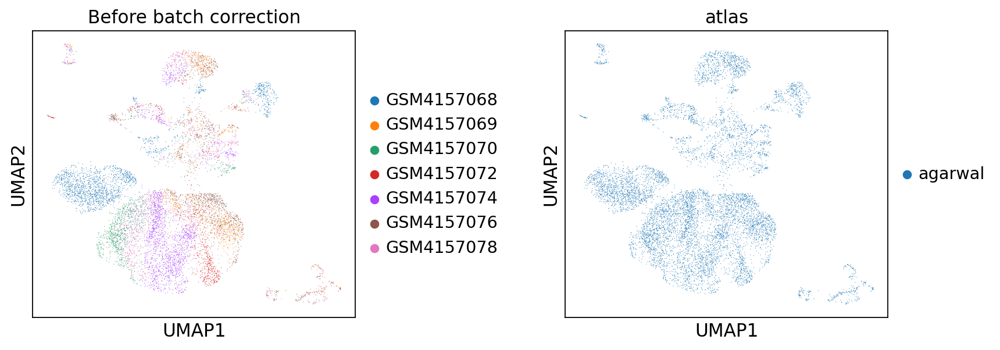

In [16]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

In [17]:
adata_agarwal_merge.obs['sample'].values

['GSM4157068', 'GSM4157068', 'GSM4157068', 'GSM4157068', 'GSM4157068', ..., 'GSM4157078', 'GSM4157078', 'GSM4157078', 'GSM4157078', 'GSM4157078']
Length: 9214
Categories (7, object): ['GSM4157068', 'GSM4157069', 'GSM4157070', 'GSM4157072', 'GSM4157074', 'GSM4157076', 'GSM4157078']

agarwal_merge


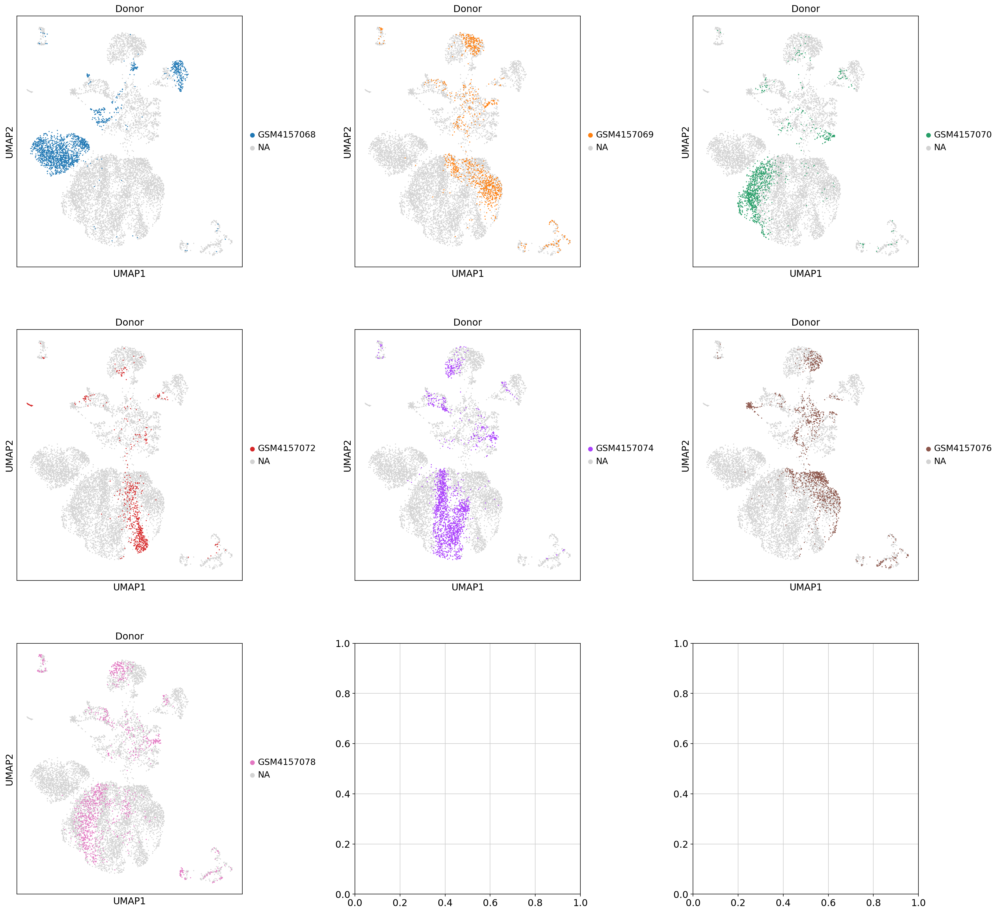

In [18]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(3, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157068', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157069', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157070', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157072', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157074', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157076', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4157078', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

agarwal_merge


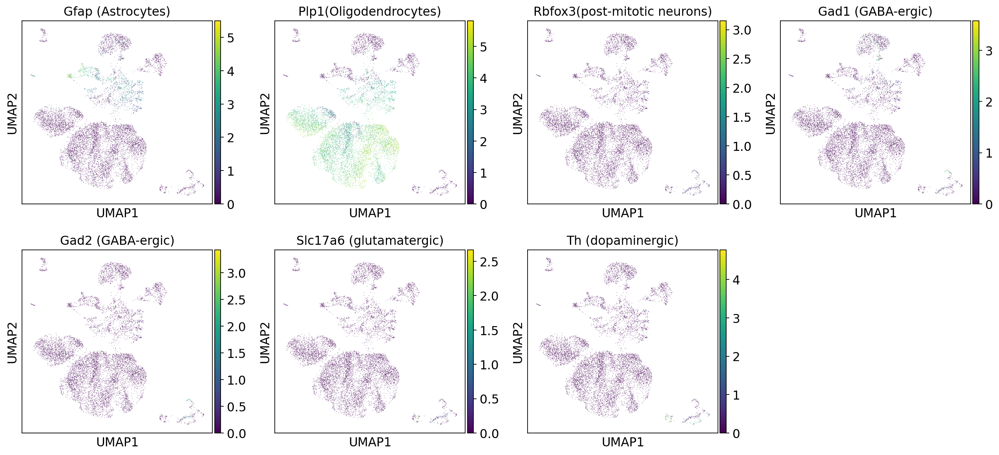

In [19]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [14]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_agarwal_merge_full_BC  is loaded


In [15]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

agarwal_merge


In [16]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['sample'])

agarwal_merge


2023-09-20 16:21:03,591 - harmonypy - INFO - Iteration 1 of 10
2023-09-20 16:21:07,629 - harmonypy - INFO - Iteration 2 of 10
2023-09-20 16:21:11,824 - harmonypy - INFO - Iteration 3 of 10
2023-09-20 16:21:15,733 - harmonypy - INFO - Iteration 4 of 10
2023-09-20 16:21:19,344 - harmonypy - INFO - Iteration 5 of 10
2023-09-20 16:21:23,424 - harmonypy - INFO - Iteration 6 of 10
2023-09-20 16:21:26,621 - harmonypy - INFO - Iteration 7 of 10
2023-09-20 16:21:28,469 - harmonypy - INFO - Iteration 8 of 10
2023-09-20 16:21:30,081 - harmonypy - INFO - Iteration 9 of 10
2023-09-20 16:21:31,366 - harmonypy - INFO - Iteration 10 of 10
2023-09-20 16:21:32,720 - harmonypy - INFO - Converged after 10 iterations


In [22]:
adata_agarwal_merge_full_BC.write('./data/agarwal_merge_base_BC.h5ad')

agarwal_merge


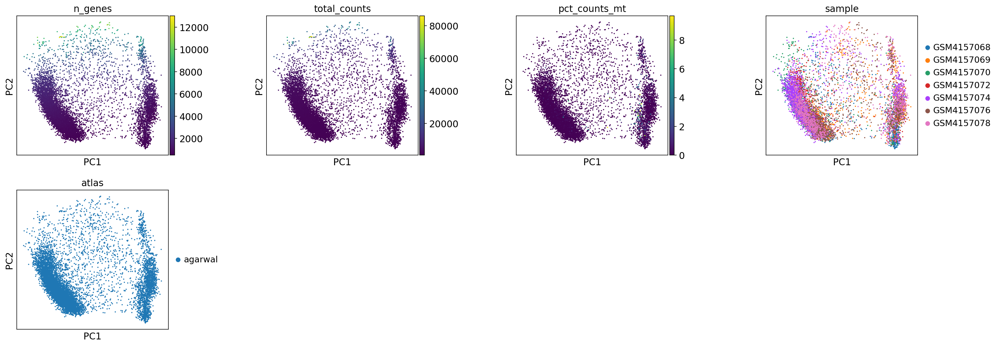

In [18]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


agarwal_merge


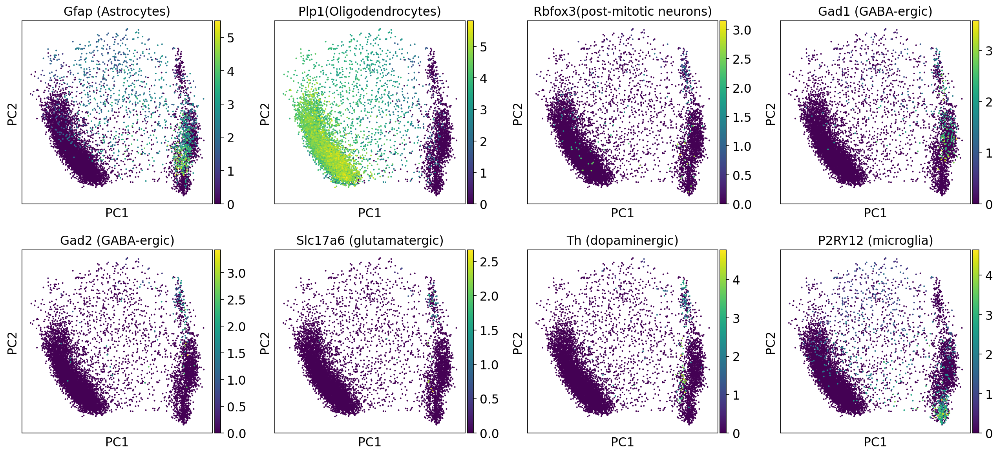

In [19]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [20]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

agarwal_merge


agarwal_merge


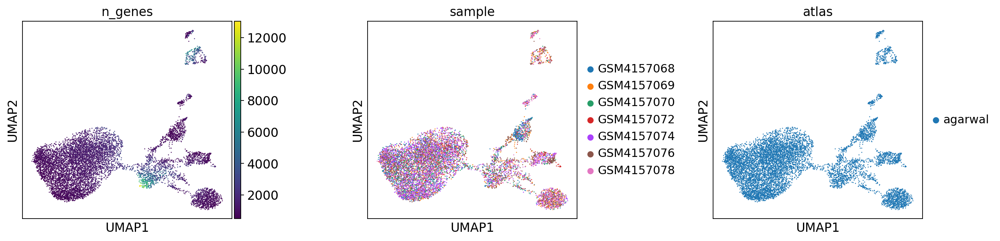

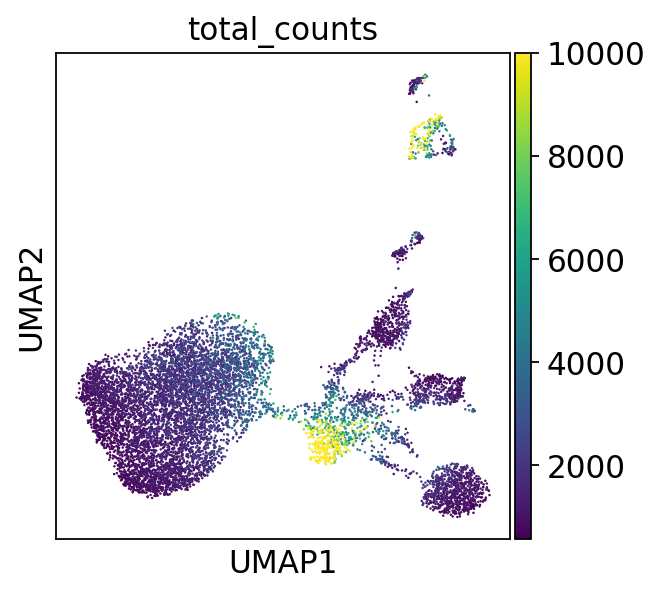

In [26]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

agarwal_merge


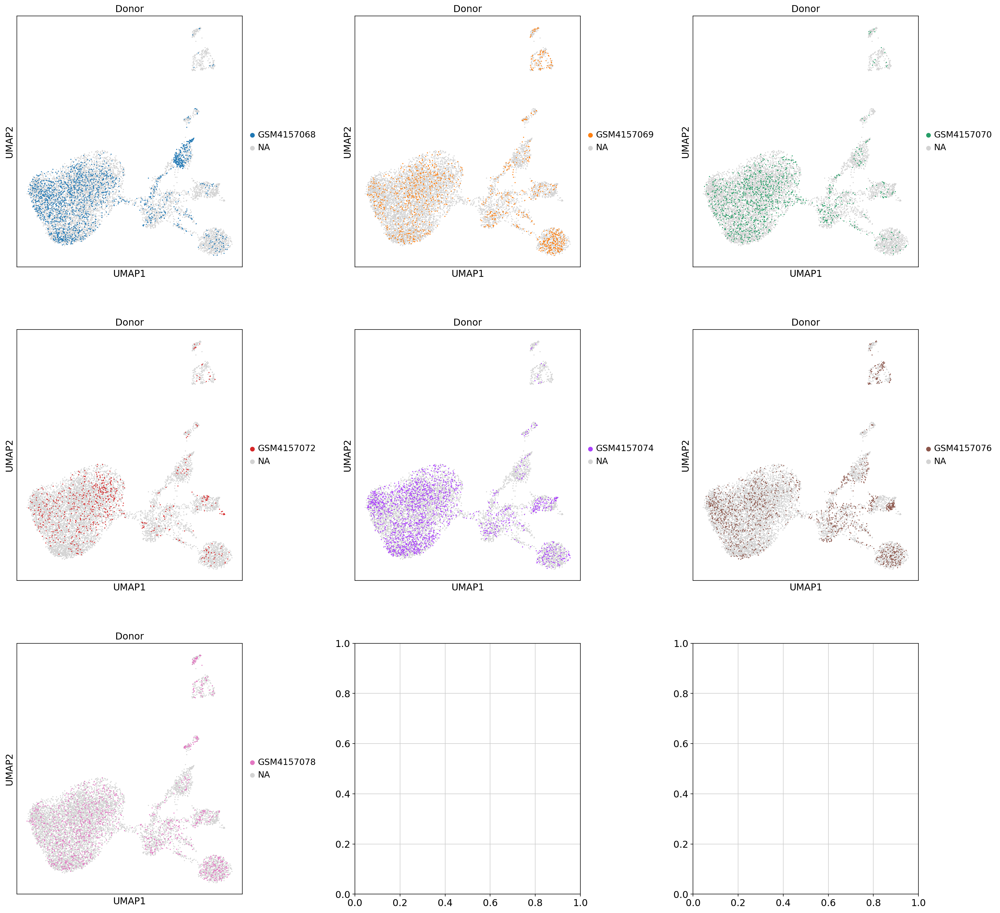

In [27]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(3, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157068', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157069', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157070', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157072', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157074', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157076', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4157078', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_BC_subplots.png',bbox_inches='tight')

agarwal_merge


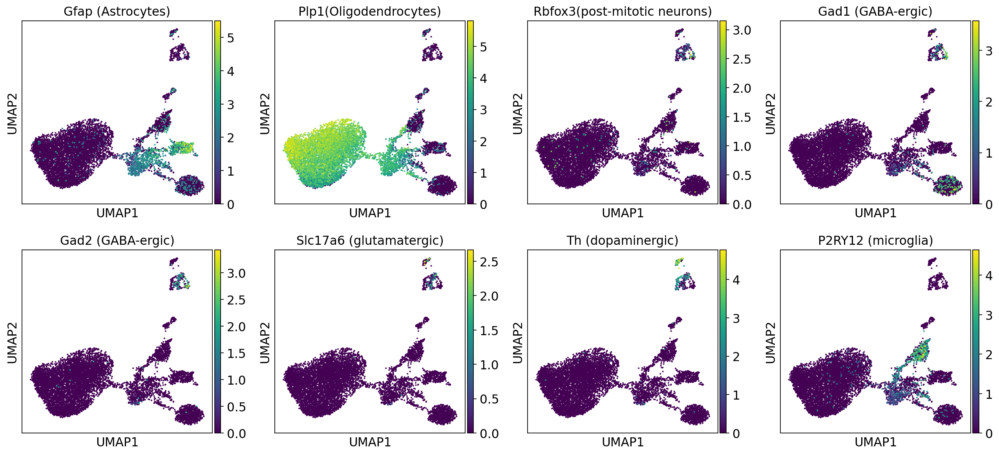

In [28]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

agarwal_merge


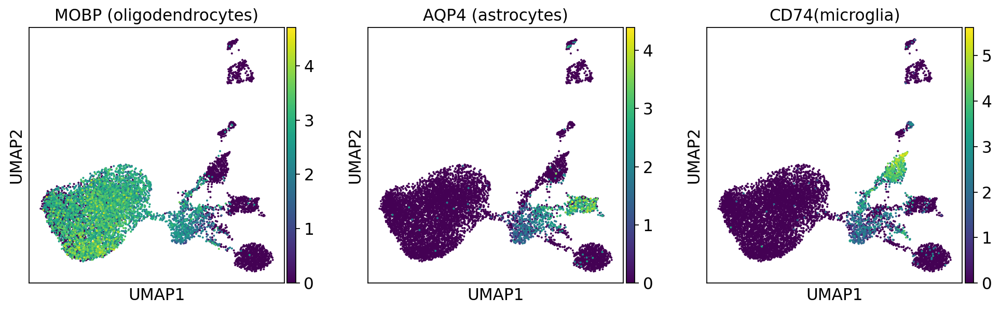

In [29]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['MOBP','AQP4', 'CD74' ],use_raw=False,title=['MOBP (oligodendrocytes)','AQP4 (astrocytes)','CD74(microglia)'])

In [30]:
locals()[object_names_merged_BC[i]]

AnnData object with n_obs × n_vars = 9214 × 26174
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_Library', 'original_Brain_Region', 'original_Level_1_cell_type', 'original_Level_2_cell_type'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

agarwal_merge


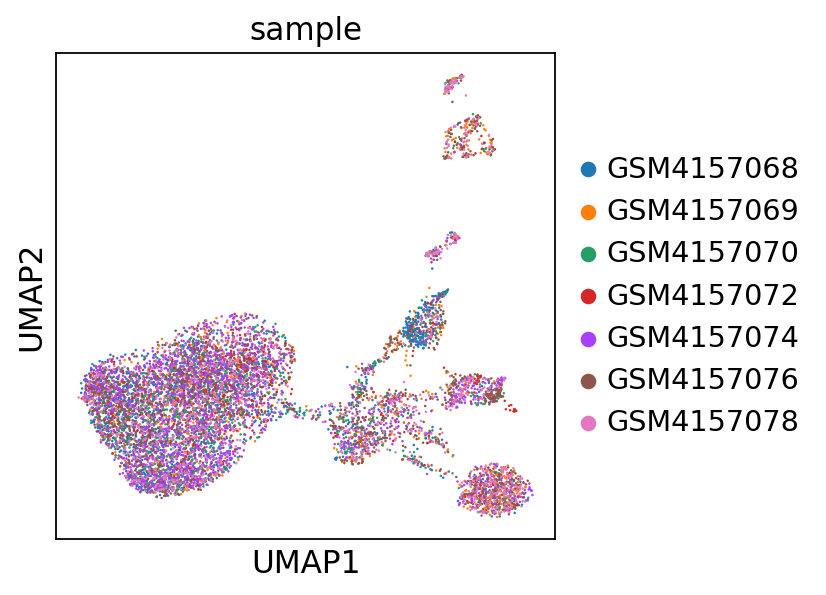

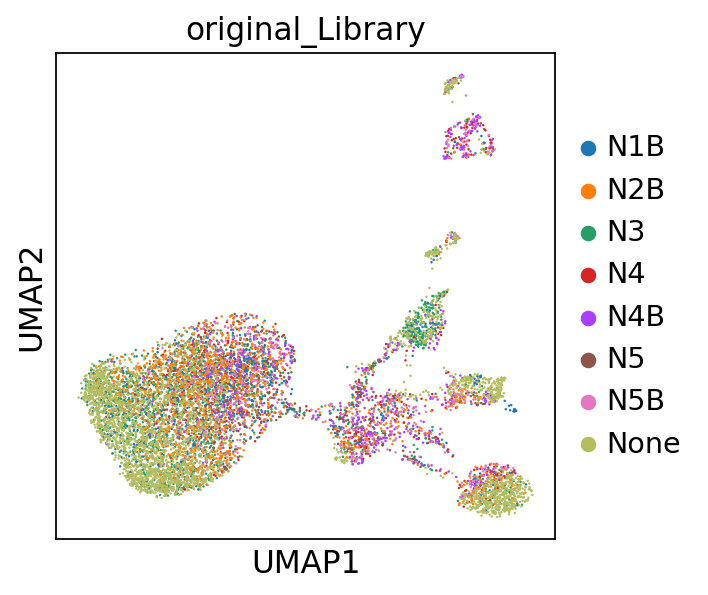

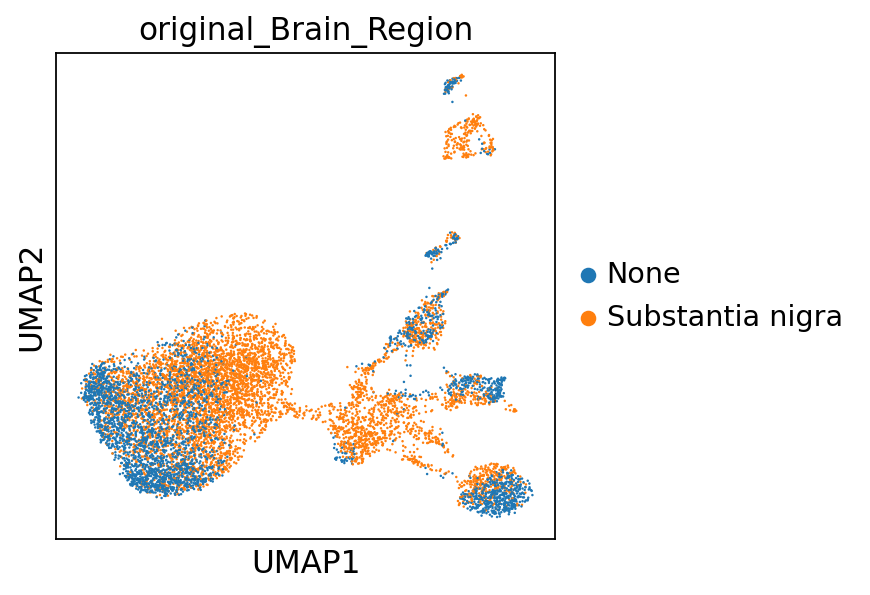

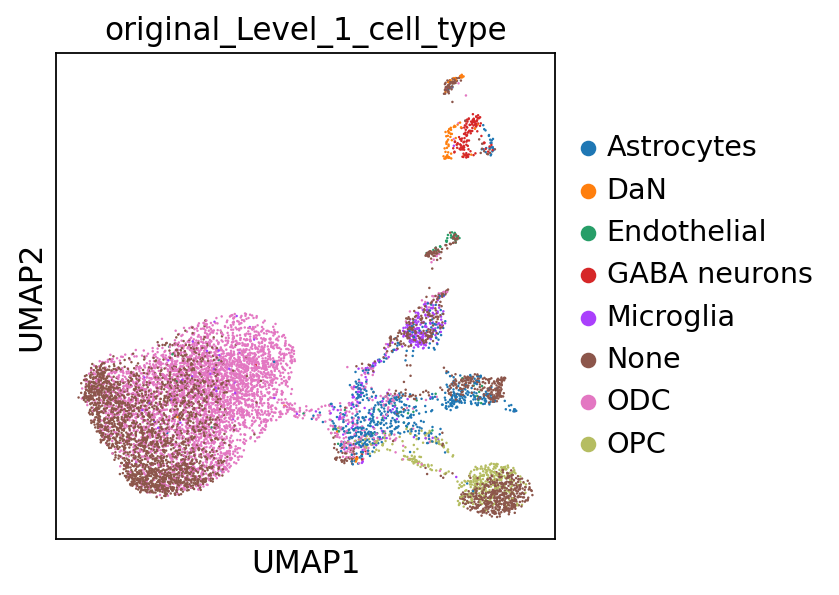

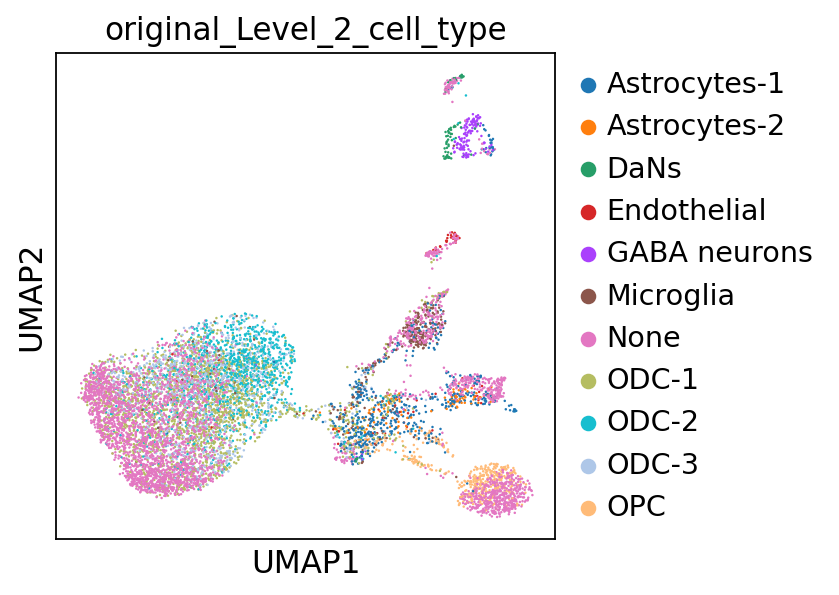

In [32]:
annotation_names= ['original_Library', 'original_Brain_Region','original_Level_1_cell_type','original_Level_2_cell_type']

annotation_names_og= ['Library', 'Brain_Region','Level_1_cell_type','Level_2_cell_type']

for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='sample', 
           use_raw=False, s=5, wspace=0.5, save='/agarwal_sample.png')
    for j in range(len(annotation_names)):
        sc.pl.umap(locals()[object_names_merged_BC[i]], color=annotation_names[j], 
                   use_raw=False, s=5, wspace=0.5, save=f'/agarwal_{annotation_names[j]}.png')
    

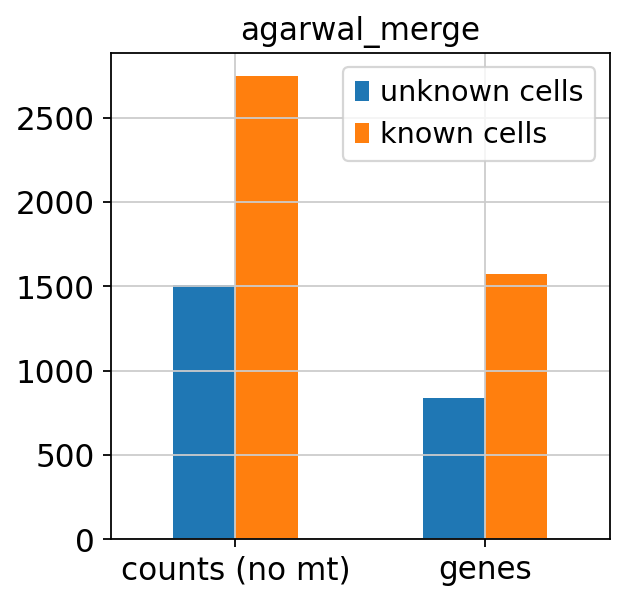

In [33]:
for i in range(numberobj):
    mean_counts_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_Level_2_cell_type'] =='None']['total_counts']))
    mean_genes_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_Level_2_cell_type'] =='None']['n_genes']))
    mean_counts = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_Level_2_cell_type'] !='None']['total_counts']))
    mean_genes = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_Level_2_cell_type'] !='None']['n_genes']))
    
    
    filtered_cells = [mean_counts_high,mean_genes_high]
    all_cells = [mean_counts,mean_genes]
    index = ['counts (no mt)', 'genes']
    
    
    df = pd.DataFrame({f'unknown cells': filtered_cells, 'known cells': all_cells}, index=index)
    
    ax = df.plot.bar(rot=0,title=names[i])

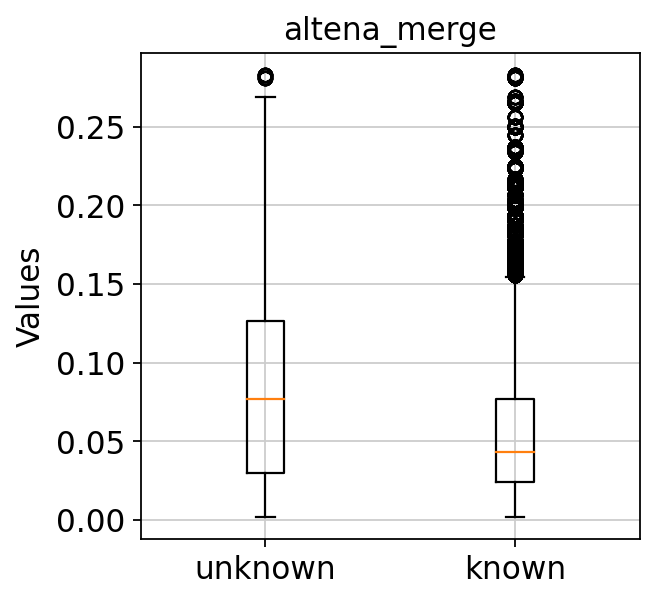

In [116]:
for i in range(numberobj):
    mean_counts_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['total_counts']))
    mean_genes_high = float(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['doublet_score']))
    mean_counts = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['total_counts']))
    mean_genes = float(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['doublet_score']))
    
    dis_high = pd.Series(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['doublet_score'].tolist())
    dis = pd.Series(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['doublet_score'].tolist())
    
    filtered_cells = [dis_high]
    all_cells = [dis]
    index = ['doublet_score']
    
    
    df = pd.DataFrame({f'unknown': dis_high})
    df2 = pd.DataFrame({f'known': dis})

    plt.boxplot([df['unknown'],df2['known']], labels=['unknown','known'])
    plt.title(names[i])
    plt.ylabel('Values')
    plt.show()

In [113]:
df2.values[0]

array([0.10460386])

In [63]:
locals()[object_names_merged_BC[i]].obs['doublet_score']

AATCACGCAACTGTGT-1-0     0.104604
ACTTATCTCGATACGT-1-0     0.095597
CTACATTGTTAAACCC-1-0     0.109616
TTAGGGTTCTTGCGCT-1-0     0.099943
AAGCCATGTATCGTTG-1-0     0.115019
                           ...   
TTCTTGAGTATTCCGA-1-11    0.022133
TGGAGAGCAAGCGCAA-1-11    0.050993
ATCACAGAGAATCTAG-1-11    0.022775
ACTTCCGCAGAATTCC-1-11    0.008286
GTACAGTGTGGTCCGT-1-11    0.027674
Name: doublet_score, Length: 85044, dtype: float64